# 06b — Visual Concept Inspection

Browse samples inline. For each sample shows:
- **Left:** original meme image
- **Right:** LRP heatmap overlay
- **Below:** VLM self-reported concepts, LRP heatmap concepts, and their mapping (if notebook 06 has been run)

In [1]:
CONFIG = {
    "dataset_path": "../../datasets/translated/",
    "vlm_explanations_dir": "./data/vlm_explanations",
    "lrp_results_dir": "./data/lrp_results",
    "mapping_dir": "./data/vlm_heatmap_mapping",
}

In [2]:
import json
from pathlib import Path

import matplotlib.pyplot as plt
from PIL import Image

DATASET_DIR = Path(CONFIG["dataset_path"])
EXPL_DIR = Path(CONFIG["vlm_explanations_dir"])
LRP_DIR = Path(CONFIG["lrp_results_dir"])
MAP_DIR = Path(CONFIG["mapping_dir"])

dataset = [json.loads(l) for l in open(DATASET_DIR / "annotations" / "test.jsonl") if l.strip()]
id_to_image = {item["id"]: DATASET_DIR / "images" / item["image"] for item in dataset}
print(f"Loaded {len(dataset)} samples")

Loaded 158 samples


In [3]:
def load_mapping(mode_key):
    p = MAP_DIR / mode_key / "mapping.json"
    if not p.exists():
        return {}
    return {r["id"]: r for r in json.load(open(p))}


def load_overlay_path(sid, mode_key):
    meta_path = LRP_DIR / f"visual_{mode_key}" / f"{sid}.json"
    if not meta_path.exists():
        return None
    overlay = json.load(open(meta_path)).get("overlay_path")
    return Path(overlay) if overlay and Path(overlay).exists() else None


def show_sample(expl, mode_key, id_to_mapping):
    sid = expl["id"]
    orig_path = id_to_image.get(sid)
    overlay_path = load_overlay_path(sid, mode_key)
    mapping = id_to_mapping.get(sid)

    vlm = expl.get("referred_image_concepts", [])
    lrp = expl.get("lrp_visual_features", [])
    pred = expl.get("pred_labels", [])

    # ── Images ────────────────────────────────────────────────────────────────
    panels = [(orig_path, "Original"), (overlay_path, "LRP Heatmap")]
    panels = [(p, t) for p, t in panels if p and p.exists()]

    if panels:
        fig, axes = plt.subplots(1, len(panels), figsize=(8 * len(panels), 6),
                                 squeeze=False)
        for ax, (p, title) in zip(axes[0], panels):
            ax.imshow(Image.open(p))
            ax.set_title(title, fontsize=11)
            ax.axis("off")
        fig.suptitle(f"{sid}  |  mode: {mode_key}", fontsize=13, fontweight="bold")
        plt.tight_layout()
        plt.show()

    # ── Concept text ──────────────────────────────────────────────────────────
    print(f"Pred:         {'; '.join(pred) if pred else '—'}")
    print(f"VLM concepts: {'; '.join(vlm) if vlm else '—'}")
    print(f"LRP concepts: {'; '.join(lrp) if lrp else '—'}")

    if mapping:
        matches = mapping.get("matches", [])
        print()
        if matches:
            print(f"Matches ({len(matches)}):")
            for vlm_c, lrp_c in matches:
                print(f"  '{vlm_c}'  →  '{lrp_c}'")
        else:
            print("Matches: none")
        unmatched_vlm = mapping.get("unmatched_vlm", [])
        unmatched_lrp = mapping.get("unmatched_lrp", [])
        if unmatched_vlm:
            print(f"Unmatched VLM: {', '.join(unmatched_vlm)}")
        if unmatched_lrp:
            print(f"Unmatched LRP: {', '.join(unmatched_lrp)}")
        print(f"Match rate: {mapping.get('match_rate', 0):.2f}")
    print("-" * 60)

No mapping found — showing concepts only (run notebook 06 for mappings)


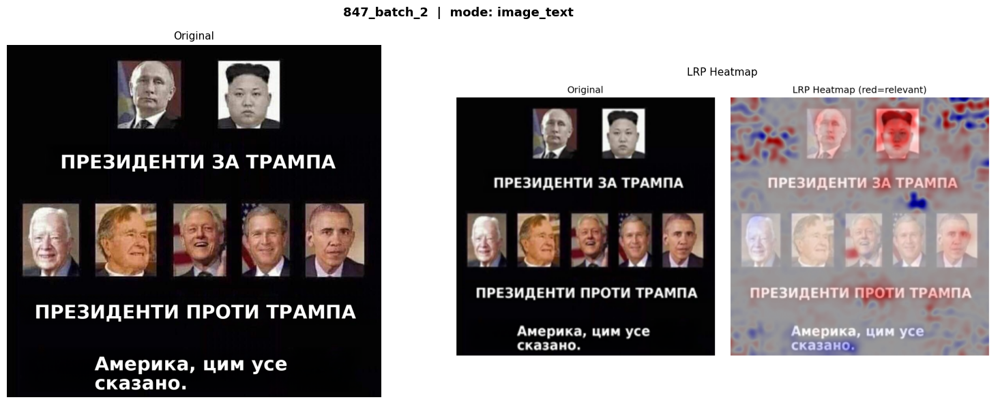

Pred:         Black-and-white Fallacy/Dictatorship; Name calling/Labeling; Appeal to (Strong) Emotions
VLM concepts: владимир путін; кім чен ын; білл клінтон; герберт н. буш; обама
LRP concepts: обличчя ким чен ина; президенти за трампа; обличчя володимира путіна; обличчя барака обами; америка, цим усе сказано
------------------------------------------------------------


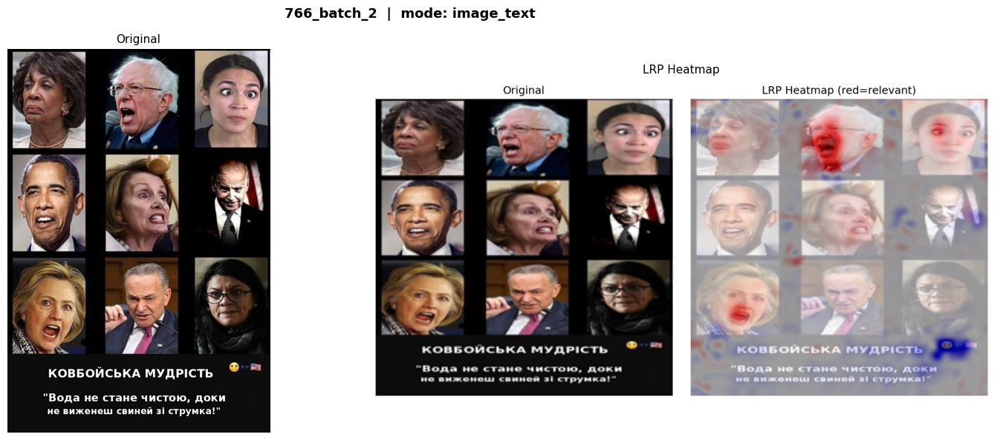

Pred:         Appeal to (Strong) Emotions; Exaggeration/Minimisation; Loaded Language
VLM concepts: берні; обама; хілларі; прапор
LRP concepts: рот берні сандерса; обличчя александрії окасіо-кортес; рот гілларі клінтон; емодзі з лайном; слово мудрість
------------------------------------------------------------


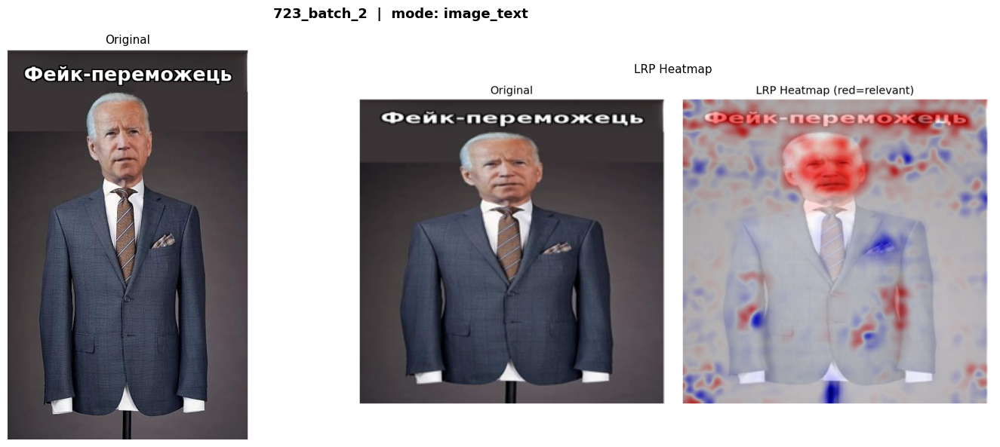

Pred:         Name calling/Labeling; Loaded Language
VLM concepts: joe biden; suit; tie
LRP concepts: обличчя джо байдена; фейк-переможець; торс у костюмі; кишеня з хустинкою; краватка
------------------------------------------------------------


In [4]:
# ── Configure and browse ──────────────────────────────────────────────────────
MODE  = "image+text"   # "image" or "image+text"
START = 0              # first sample index (inclusive)
END   = 3              # last sample index (exclusive)

mode_key = MODE.replace("+", "_")
explanations = json.load(open(EXPL_DIR / mode_key / "explanations.json"))
id_to_mapping = load_mapping(mode_key)

if not id_to_mapping:
    print("No mapping found — showing concepts only (run notebook 06 for mappings)")

for expl in explanations[START:END]:
    show_sample(expl, mode_key, id_to_mapping)

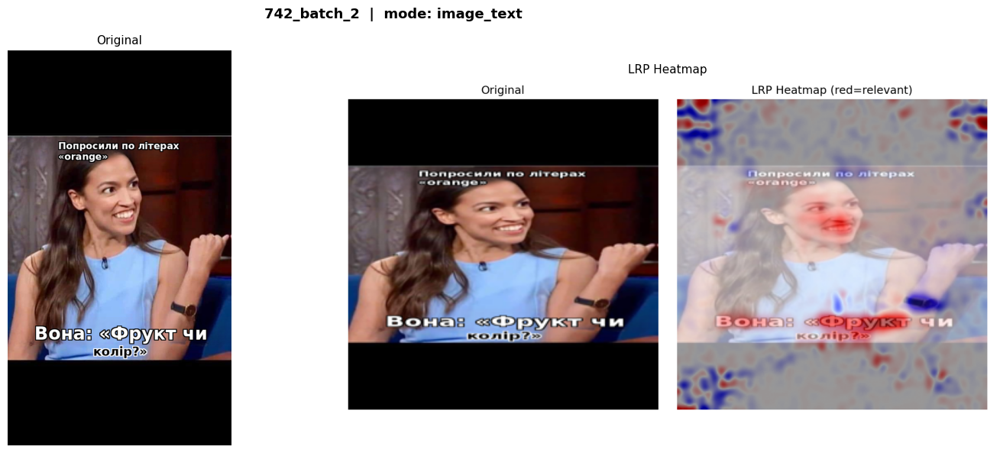

Pred:         Loaded Language; Appeal to (Strong) Emotions
VLM concepts: жінка; сміється; годинник
LRP concepts: фрукт чи; обличчя жінки; рука жінки з годинником; колір
------------------------------------------------------------


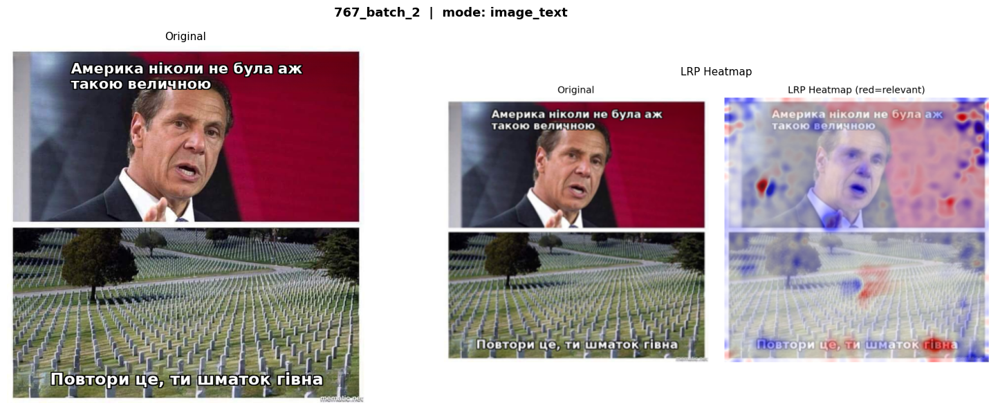

Pred:         Appeal to fear/prejudice; Loaded Language; Exaggeration/Minimisation
VLM concepts: прапор; пам'ятники; чоловік
LRP concepts: обличчя чоловіка; повтори це, ти шматок гівна; ряд надгробків на передньому плані; червона частина фону праворуч від обличчя; америка ніколи не була аж такою величною
------------------------------------------------------------


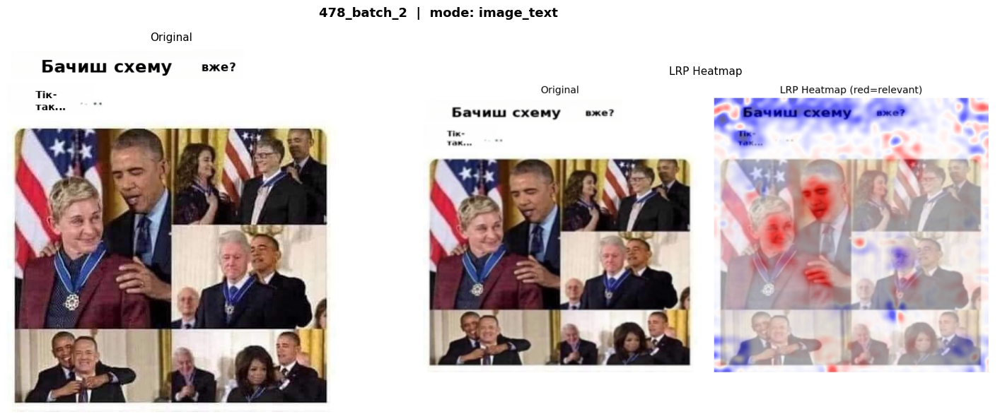

Pred:         Appeal to (Strong) Emotions; Repetition
VLM concepts: обама; медаль; прапор
LRP concepts: обличчя жінки вгорі зліва; обличчя барака обами вгорі зліва; медаль на шиї жінки вгорі зліва; обличчя чоловіка з медаллю в центрі; обличчя барака обами в центрі
------------------------------------------------------------


In [5]:
for expl in explanations[3:6]:
    show_sample(expl, mode_key, id_to_mapping)

No mapping found — showing concepts only (run notebook 06 for mappings)


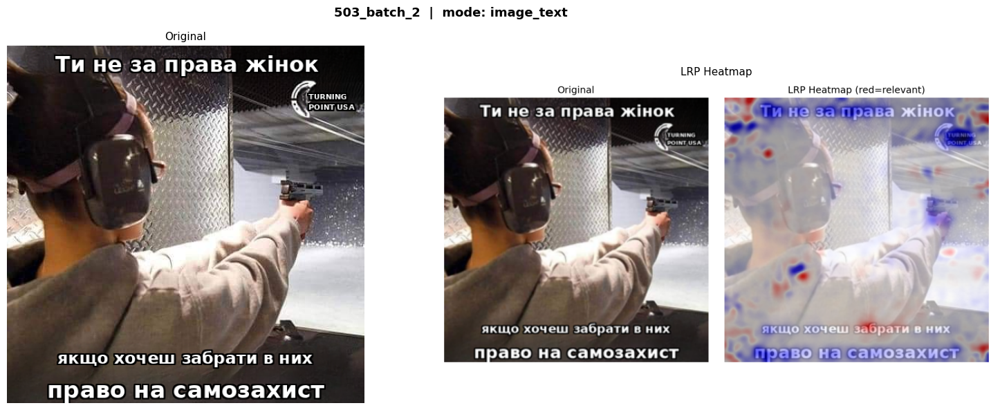

Pred:         Appeal to fear/prejudice; Loaded Language
VLM concepts: пістолет; шум; захист
LRP concepts: право на самозахист; ти не за права жінок; жінка зі зброєю; пістолет у витягнутій руці; логотип turning point usa
------------------------------------------------------------


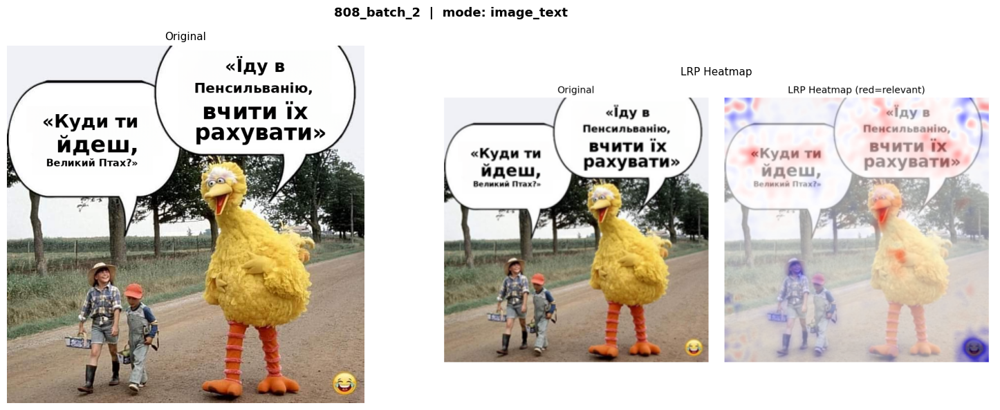

Pred:         Loaded Language; Appeal to (Strong) Emotions
VLM concepts: птах; діти; сміх
LRP concepts: йду в пенсильванію, вчити їх рахувати; великий птах; куди ти йдеш, великий птах; старший хлопчик; смайлик внизу праворуч
------------------------------------------------------------


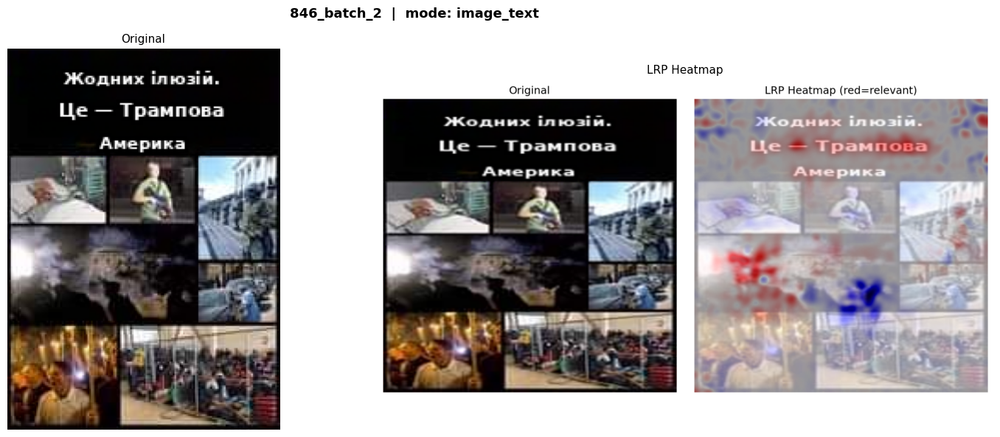

Pred:         Appeal to fear/prejudice; Name calling/Labeling
VLM concepts: people; smoke; chaos
LRP concepts: це — трампова; жодних ілюзій; америка; карта сша в диму; натовп з факелами
------------------------------------------------------------


In [6]:
# ── Configure and browse ──────────────────────────────────────────────────────
MODE  = "image+text"   # "image" or "image+text"
START = 6              # first sample index (inclusive)
END   = 9              # last sample index (exclusive)

mode_key = MODE.replace("+", "_")
explanations = json.load(open(EXPL_DIR / mode_key / "explanations.json"))
id_to_mapping = load_mapping(mode_key)

if not id_to_mapping:
    print("No mapping found — showing concepts only (run notebook 06 for mappings)")

for expl in explanations[START:END]:
    show_sample(expl, mode_key, id_to_mapping)

No mapping found — showing concepts only (run notebook 06 for mappings)


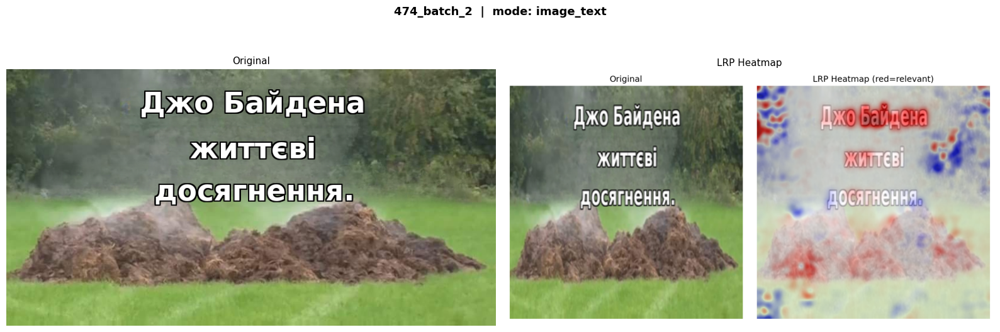

Pred:         Exaggeration/Minimisation; Loaded Language
VLM concepts: грязна купа; зелена трава; дим
LRP concepts: джо байдена; життєві; досягнення; купа гною; зелена трава навколо купи гною
------------------------------------------------------------


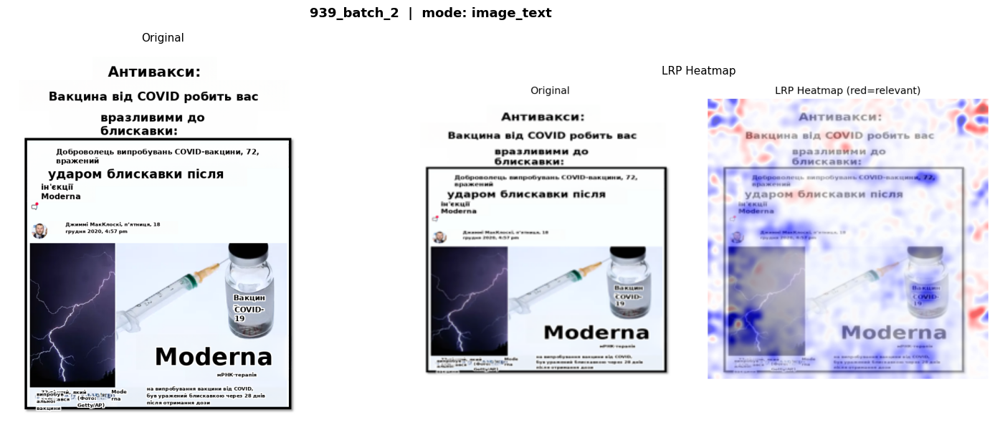

Pred:         Appeal to fear/prejudice; Exaggeration/Minimisation; Loaded Language
VLM concepts: блискавка; ін'єкція; вакцина
LRP concepts: блискавка; шприц; флакон з написом вакцина covid-19; антивакси; moderna
------------------------------------------------------------


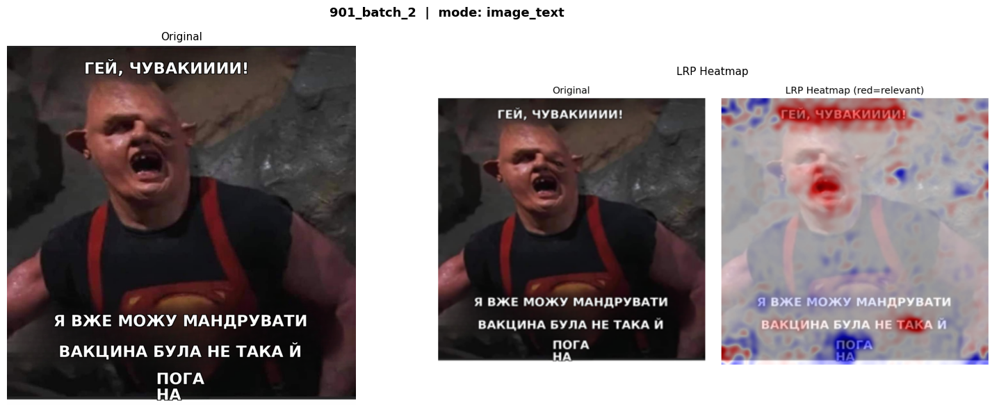

Pred:         Appeal to fear/prejudice; Name calling/Labeling; Exaggeration/Minimisation
VLM concepts: злісний вираз обличчя; відкритий рот; показник злісності
LRP concepts: обличчя чоловіка; гей, чувакииии; вакцина була не така й; я вже можу мандрувати; пога на
------------------------------------------------------------


In [8]:
# ── Configure and browse ──────────────────────────────────────────────────────
MODE  = "image+text"   # "image" or "image+text"
START = 9              # first sample index (inclusive)
END   = 12              # last sample index (exclusive)

mode_key = MODE.replace("+", "_")
explanations = json.load(open(EXPL_DIR / mode_key / "explanations.json"))
id_to_mapping = load_mapping(mode_key)

if not id_to_mapping:
    print("No mapping found — showing concepts only (run notebook 06 for mappings)")

for expl in explanations[START:END]:
    show_sample(expl, mode_key, id_to_mapping)

No mapping found — showing concepts only (run notebook 06 for mappings)


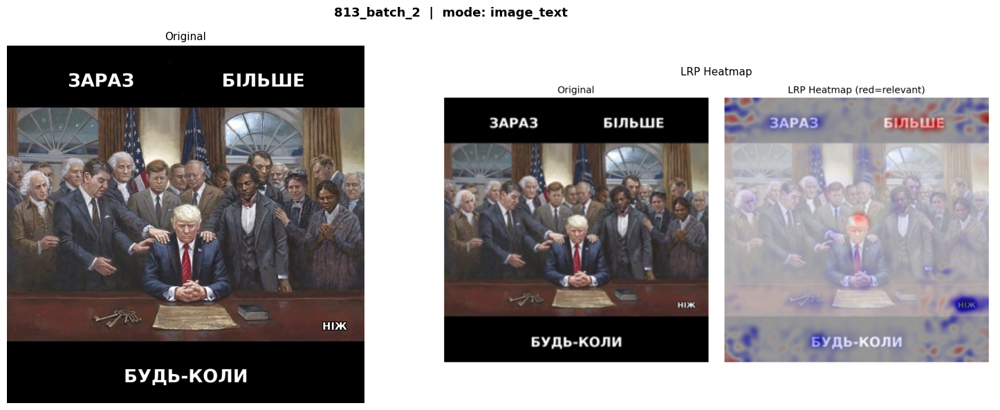

Pred:         Exaggeration/Minimisation; Loaded Language
VLM concepts: прапор; обама; піднятий кулак
LRP concepts: дональд трамп; будь-коли; ніж; зараз; більше
------------------------------------------------------------


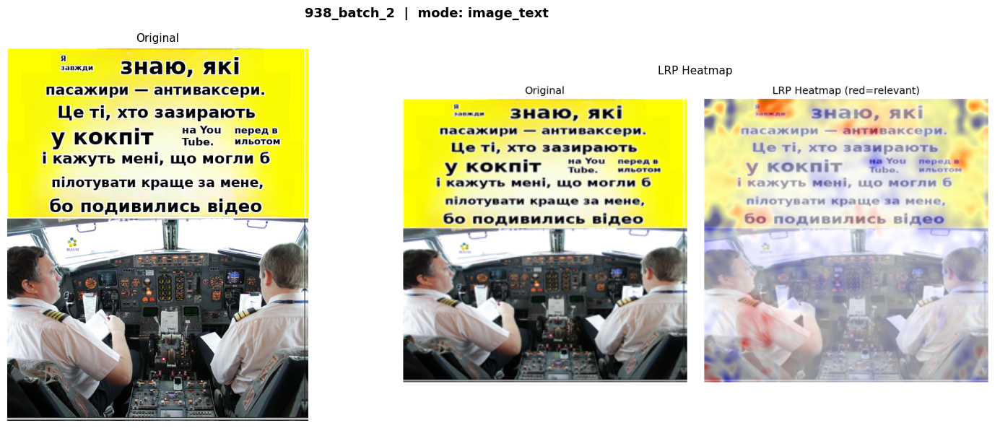

Pred:         Appeal to fear/prejudice; Name calling/Labeling; Loaded Language
VLM concepts: пілоти; кокпіт; пульт
LRP concepts: антиваксери; бо подивились відео; пасажири; кокпіт; чоловік ліворуч у кабіні
------------------------------------------------------------


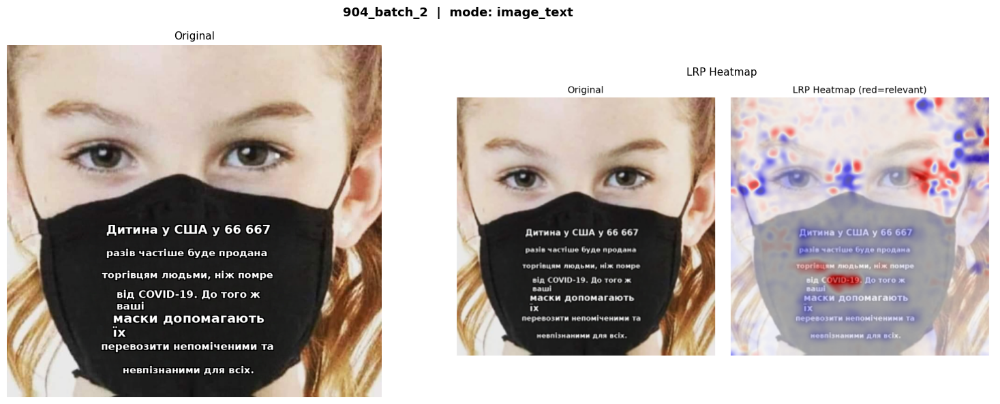

Pred:         Appeal to fear/prejudice; Exaggeration/Minimisation; Loaded Language
VLM concepts: дитина; маска; глаза
LRP concepts: covid-19; очі дівчинки; торгівцям людьми; маски допомагають; обличчя дівчинки
------------------------------------------------------------


In [10]:
# ── Configure and browse ──────────────────────────────────────────────────────
MODE  = "image+text"   # "image" or "image+text"
START = 12              # first sample index (inclusive)
END   = 15              # last sample index (exclusive)

mode_key = MODE.replace("+", "_")
explanations = json.load(open(EXPL_DIR / mode_key / "explanations.json"))
id_to_mapping = load_mapping(mode_key)

if not id_to_mapping:
    print("No mapping found — showing concepts only (run notebook 06 for mappings)")

for expl in explanations[START:END]:
    show_sample(expl, mode_key, id_to_mapping)

No mapping found — showing concepts only (run notebook 06 for mappings)


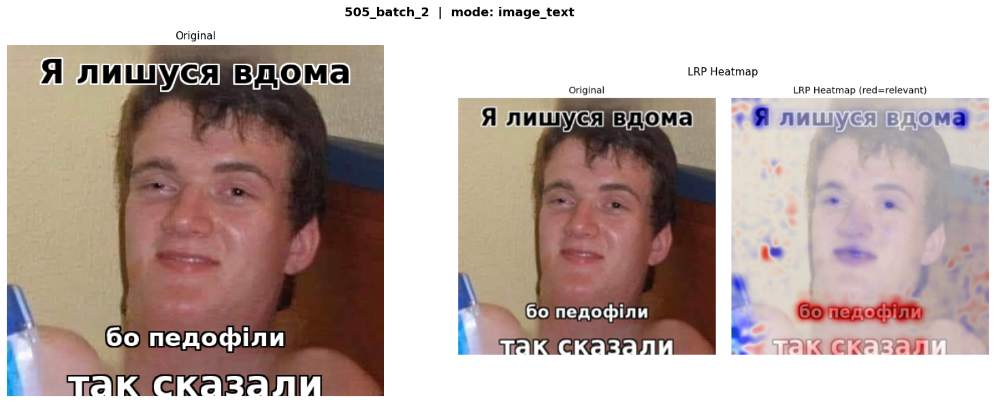

Pred:         Appeal to fear/prejudice; Name calling/Labeling
VLM concepts: чоловік; сміється; без одягу
LRP concepts: бо педофіли; так сказали; обличчя чоловіка; я лишуся вдома; пляшка в руці чоловіка
------------------------------------------------------------


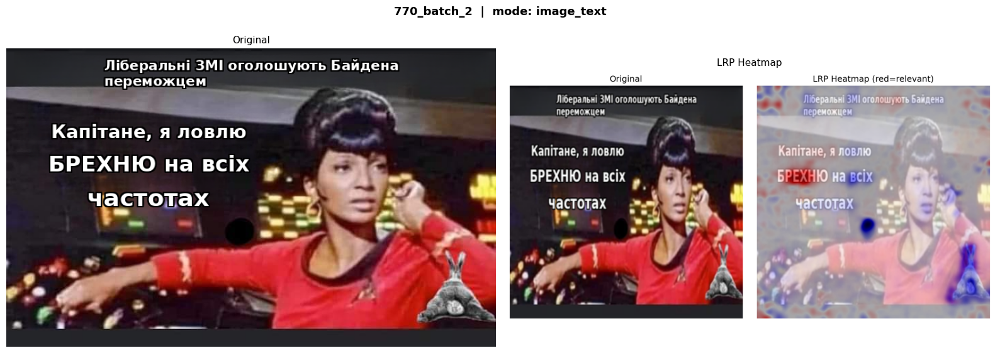

Pred:         Appeal to fear/prejudice; Loaded Language
VLM concepts: капітане; радіо; піднятій кулак
LRP concepts: брехню; жінка; ліберальні змі оголосять байдена переможцем; я ловлю; кролик внизу праворуч
------------------------------------------------------------


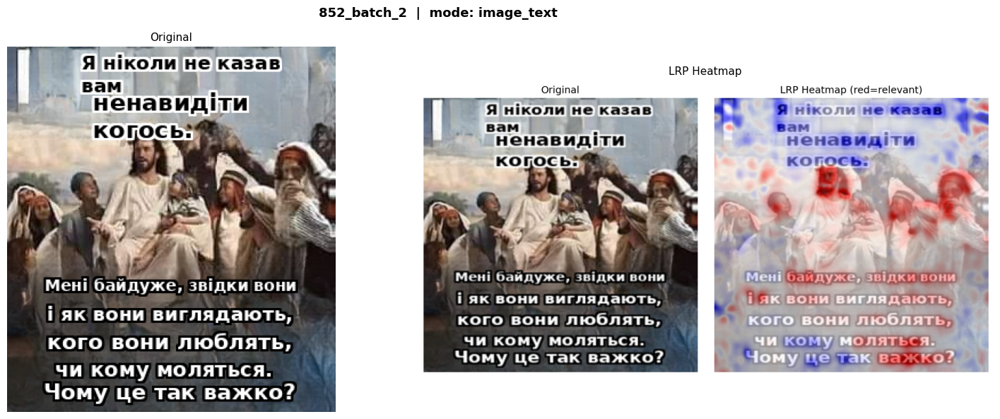

Pred:         Appeal to (Strong) Emotions; Loaded Language
VLM concepts: ісус; підняті руки; група людей
LRP concepts: і як вони виглядають, кого вони люблять, чи кому моляться. чому це так важко; мені байдуже, звідки вони; ненавидіти когось; чоловік у центрі з дитиною на руках; люди праворуч від центрального чоловіка
------------------------------------------------------------


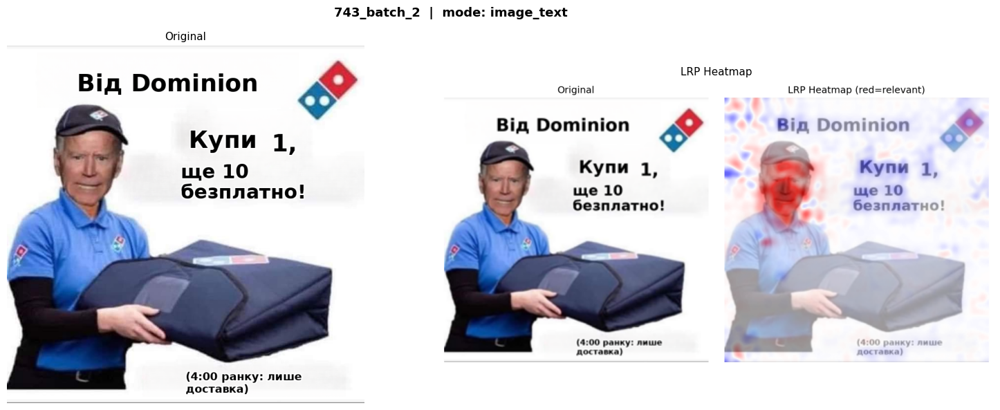

Pred:         Appeal to authority; Exaggeration/Minimisation
VLM concepts: joe biden; домініон; пакет доставки
LRP concepts: обличчя чоловіка в кепці; купи 1; ще 10 безплатно; від dominion; логотип domino’s у правому верхньому куті
------------------------------------------------------------


In [11]:
# ── Configure and browse ──────────────────────────────────────────────────────
MODE  = "image+text"   # "image" or "image+text"
START = 15              # first sample index (inclusive)
END   = 19              # last sample index (exclusive)

mode_key = MODE.replace("+", "_")
explanations = json.load(open(EXPL_DIR / mode_key / "explanations.json"))
id_to_mapping = load_mapping(mode_key)

if not id_to_mapping:
    print("No mapping found — showing concepts only (run notebook 06 for mappings)")

for expl in explanations[START:END]:
    show_sample(expl, mode_key, id_to_mapping)

In [43]:
gt = [
    "обличчя ким чен ина; президенти за трампа; обличчя володимира путіна; обличчя барака обами; америка, цим усе сказано",
    "рот берні сандерса; обличчя александрії окасіо-кортес; рот гілларі клінтон; емодзі з лайном; слово мудрість",
    "обличчя джо байдена; фейк-переможець; кишеня з хустинкою; краватка",
    "фрукт чи колір; обличчя жінки; рука жінки з годинником",
    "обличчя чоловіка; повтори це, ти шматок гівна; червона частина фону праворуч від обличчя; америка ніколи не була аж такою величною",
    "обличчя жінки вгорі зліва; обличчя барака обами вгорі зліва; медаль на шиї жінки вгорі зліва; обличчя чоловіка з медаллю в центрі; Бачиш схему вже, тік-так",
    "право на самозахист; ти не за права жінок; жінка зі зброєю; пістолет у витягнутій руці; логотип turning point usa",
    "йду в пенсильванію, вчити їх рахувати; великий птах; куди ти йдеш, великий птах; старший хлопчик; смайлик внизу праворуч",
    "це — трампова америка;люди зі зброєю; військовий",
    "джо байдена; життєві; досягнення; купа гною",
    "блискавка; флакон з написом вакцина covid-19; антивакси; moderna; Вакцина від covid",
    "обличчя чоловіка; гей, чувакииии; вакцина була не така й погана; я вже можу мандрувати",
    "ніж; зараз; більше; дональд трамп; будь-коли",
    "я завжди; антиваксери; бо подивились відео; пасажири; кокпіт; чоловік ліворуч у кабіні",
    "covid-19; торгівцям людьми; дитина у сша буде у 66667 разів частіше продана; маски допомагають; обличчя дівчинки",
    "я лишуся вдома; бо педофіли; обличчя чоловіка; так сказали",
    "брехню; ліберальні змі оголосять байдена переможцем; я ловлю; кролик внизу праворуч",
    "і як вони виглядають, кого вони люблять, чи кому моляться. чому це так важко; мені байдуже, звідки вони; ненавидіти когось; чоловік у центрі з дитиною на руках; люди праворуч від центрального чоловіка",
    "обличчя чоловіка в кепці; купи 1; ще 10 безплатно; від dominion; логотип domino’s у правому верхньому куті",
]

In [48]:
#compute accuracy 
total = len(gt)
overlaps = []
for i, gt_concepts in enumerate(gt):
    expl = explanations[i]
    pred_concepts = set(expl.get("lrp_visual_features", []))
    gt_concepts_set = set([c.strip() for c in gt_concepts.split(";")])
    #compute overlap
    min_len = min(len(pred_concepts), len(gt_concepts_set))
    overlap = len(pred_concepts.intersection(gt_concepts_set))/min_len
    overlaps.append(overlap)

print(f"Accuracy: {sum(overlaps)}/{total} = {sum(overlaps)/total:.2f}")

Accuracy: 16.816666666666666/19 = 0.89
